# Counting the Crowds
This notebook demonstrates several approaches to automatic counting of people using images from indoor video cameras in a shopping center.

- **Out-of-the-box solution: EfficientDet** object detection model loaded from **TensorFlow Hub**. The model is capable of detecting a wide range of objects returning predicted class, bounding box coordinates and confidence score for each object. Benefits: doesn't require training, multiple models are available, could be easily deployed on various devices. Drawbacks: model is prone to errors when detecting multiple objects, objects partly accluded or located at the background, model is difficult to retrain and fine-tune.
- **Transfer learning: InceptionResNetV2** as feature extractor with a new regression head. Benefits: model is relatively easy to fine-tune for a new task while retaining the useful knowledge of the original classifier. Drawbacks: despite higher accuracy compared to the previous solution, this model is not perfect and could not be used in environments where high precision is important.

#  <a name=Appendix>Appendix:</a>

- Clic on the links:
>1. <a href=#imports>Imports</a>
>2. <a href=#def>Helper Function</a>
>3. <a href=#Load>Load Data</a>
>4. <a href=#EDA>Exploratory Data Analysis</a>  
>5. <a href=#Model>Model</a>
>6. <a href=#Future>Future Work</a>
>7. <a href=#Summary>Summary</a>

## Part 1: Using out-of-the-box model

**EfficientDet model:** SSD with EfficientNet + BiFPN feature extractor, shared box predictor and focal loss, trained on COCO 2017 dataset. Several models of various sizes could be found at TF Hub. We will use the smallest model d0.

**Model inputs:** a three-channel image of variable size - a tf.uint8 tensor with shape [1, height, width, 3] with values in [0, 255].

#### Algorithm
- Extract example images from .jpg files and convert to tf.Tensor without resizing or preprocessing.
- Visualize model predictions overlaying predicted bounding boxes over the example images.
- Select the minimum confidence score to improve the model accuracy.
- Check the accuracy on randomly selected subset of images:
  - EfficientDet model cannot process batches of images, so we process them one by one using multiprocessing for time optimization.
  - Postprocess the model output for each image counting the number of objects identified as "person" with a selected confidence threshold.

 #### <a href='#Appendix'>Return to Appendix </a> 

_______________________


# <a name='imports'>Libraries Imports</a> 

In [1]:
#pip install tensorflow_hub

In [1]:
import time
import concurrent.futures
from tqdm import tqdm
import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import PIL
from PIL.ImageDraw import Draw
from PIL import Image, ImageDraw, ImageFont

In [2]:
import scipy
import scipy.io
import scipy.stats as stats
import scipy.ndimage
import itertools
import os

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, mean_squared_error
import itertools

from keras.utils.np_utils import to_categorical # convert to one-hot-encoding
from keras.models import *
from keras.layers import *
from tensorflow.keras import optimizers
optimizers.RMSprop
optimizers.Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.applications import vgg16, inception_v3, resnet50
from tensorflow.keras import backend

In [4]:
import os
import random

In [17]:
 #### <a href='#Appendix'>Return to Appendix </a> 

_______________________
 #### <a href='#Appendix'>Return to Appendix </a> 

_______________________
# #roi = scipy.io.loadmat('/home/vis/perspective_roi.mat')
# #mall_gt = scipy.io.loadmat('/home/vis/mall_gt.mat')
# #mall_feat = scipy.io.loadmat('/home/vis/mall_feat.mat')

# ## Replace the above paths with this: ##
# # /home/vis/ => /home/mayakurtser-putty/matlab_mall/
# # importing the data and convert it from a matlab object into a dictionary
# # store the files in the home folder of the jupiter notebook
# folder = os.getcwd()
# # print(folder)
# # print(os.path)
# roi = scipy.io.loadmat('C:/Users/imora/Downloads/Crowd-Counting-TensorFlow-CNN-master/mall_dataset/perspective_roi.mat')
# mall_gt = scipy.io.loadmat('C:/Users/imora/Downloads/Crowd-Counting-TensorFlow-CNN-master/mall_dataset/mall_gt.mat')
# mall_feat = scipy.io.loadmat('C:/Users/imora/Downloads/Crowd-Counting-TensorFlow-CNN-master/mall_dataset/mall_feat.mat')

 #### <a href='#Appendix'>Return to Appendix </a> 

_______________________


# <a name='def'>Helper function</a> 

In [8]:
def reconstruct_path(image_id: int) -> str:
    """Function transforms numerical image ID
    into a relative file path filling in leading zeros
    and adding file extension and directory.
    :param image_id: Image ID
    :return: Relative path to the image
    """
    image_id = str(image_id).rjust(6, '0')
    return f'C:/Users/imora/Downloads/Crowd-Counting-TensorFlow-CNN-master/mall_dataset/frames/seq_{image_id}.jpg'


def detect_objects(path: str, model) -> dict:
    """Function extracts image from a file, adds new axis
    and passes the image through object detection model.
    :param path: File path
    :param model: Object detection model
    :return: Model output dictionary
    """
    image_tensor = tf.image.decode_jpeg(
        tf.io.read_file(path), channels=3)[tf.newaxis, ...]
    return model(image_tensor)


def count_persons(path: str, model, threshold=0.) -> int:
    """Function counts the number of persons in an image
    processing "detection_classes" output of the model
    and taking into account confidence threshold.
    :param path: File path
    :param model: Object detection model
    :param threshold: Threshold for confidence scores
    :return: Number of people for one image
    """
    results = detect_objects(path, model)
    #Class ID 1 = "person"
    results = (results['detection_classes'].numpy()[0] == 1)[np.where(results['detection_scores'].numpy()[0] > threshold)].sum()
    return results


def draw_bboxes(image_path, data: dict,threshold=0.) -> PIL.Image:
    """Function displays an image with bounding boxes
    overlaid for every detected person.
    :param image_path: File path to an image
    :param data: Output of objects detection model for this image
    :param threshold: Threshold for confidence scores
    :return: PIL.Image object
    """
    


  
    image = PIL.Image.open(image_path)
    draw = Draw(image)

    im_width, im_height = image.size

    boxes = data['detection_boxes'].numpy()[0]
    classes = data['detection_classes'].numpy()[0]
    scores = data['detection_scores'].numpy()[0]

    for i in range(int(data['num_detections'][0])):
        if classes[i] == 1 and scores[i] > threshold:
            ymin, xmin, ymax, xmax = boxes[i]
            (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                          ymin * im_height, ymax * im_height)
            draw.line([(left, top), (left, bottom), (right, bottom), (right, top), (left, top)],
                      width=4, fill='red')
            

    return image

def set_display():
    """Function sets display options for charts and pd.DataFrames.
    """
    # Plots display settings
    plt.style.use('fivethirtyeight')
    plt.rcParams['figure.figsize'] = 10, 6
    plt.rcParams.update({'font.size': 12})
    # DataFrame display settings
    pd.set_option('display.max_columns', None)
    pd.set_option('display.max_rows', None)
    pd.options.display.float_format = '{:.4f}'.format

In [9]:
def draw_bb(image_path, data: dict,threshold) -> PIL.Image:
    """Function displays an image with bounding boxes
    overlaid for every detected person.
    :param image_path: File path to an image
    :param data: Output of objects detection model for this image
    :param threshold: Threshold for confidence scores
    :return: PIL.Image object
    """
    

    

    cp = count_persons(image_path , detector ,threshold)
    cn = str(cp)
    
    image = PIL.Image.open(image_path)
    draw = Draw(image)

    im_width, im_height = image.size

    boxes = data['detection_boxes'].numpy()[0]
    classes = data['detection_classes'].numpy()[0]
    scores = data['detection_scores'].numpy()[0]
    


    for i in range(int(data['num_detections'][0])):
        if classes[i] == 1 and scores[i] > threshold:
            ymin, xmin, ymax, xmax = boxes[i]
            (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                          ymin * im_height, ymax * im_height)
            draw.line([(left, top), (left, bottom), (right, bottom), (right, top), (left, top)],
                      width=4, fill='red')
            fontsize = 30
            font = ImageFont.truetype("arial.ttf", fontsize)
            draw.text((25,25), cn, fill=(255,255,150),font=font)
            if cp >=20:
                draw.text((70,25), "too crowd !", fill=(255,255,150),font=font)
            else:
                draw.text((70,25), "Save", fill=(255,255,150),font=font)
                

    return image

### Functions for Transfer Learning 

In [30]:
def load_image(is_labelled: bool, is_training=True):
    """Wrapper function that returns a function
    for loading a single image if is_labelled=False
    or a function for loading image in an image-label pair
    if is_labelled=True.
    :param is_labelled: Boolean argument defining the return
    :param is_training: Boolean argument for image augmentation
    :return: Function
    """
    def _get_image(path: str) -> tf.Tensor:
        """Function loads image from a file.
        :param path: Path to image file
        :return: Tensor with preprocessed image
        """
        image = tf.image.decode_jpeg(tf.io.read_file(path), channels=3)
        image = tf.cast(image, dtype=tf.int32)
        image = tf.image.resize_with_pad(image, IMAGE_SIZE, IMAGE_SIZE)
        if is_training:
            image = tf.image.random_flip_left_right(image)
            image = tf.image.random_brightness(image, 0.1)
            image = tf.image.random_contrast(image, 0.1, 0.2)
            image = tf.image.random_saturation(image, 0.9, 1.1)
            image = tf.image.random_hue(image, 0.1)
        return tf.keras.applications.inception_resnet_v2.preprocess_input(image)

    def _get_image_label(img: tf.Tensor, label: int) -> tuple:
        """Function loads the image in an image-label pair.
        :param img: Tensor with original image
        :param label: Target value
        :return: Tuple with TF tensor and label
        """
        return _get_image(img), label

    return _get_image_label if is_labelled else _get_image


def prepare_dataset(dataset, is_training=True, is_labeled=True):
    """Function transforms a TF dataset containing file paths
    or file paths and labels to a dataset with image tensors and labels.
    :param dataset: Original dataset
    :param is_training: Argument defines if shuffling and image augmentation should be applied
    :param is_labeled: Argument defines if the dataset contains labels
    :return: Updated dataset
    """
    image_read_fn = load_image(is_labeled, is_training)
    dataset = dataset.map(image_read_fn, num_parallel_calls=AUTOTUNE)
    return dataset.batch(BATCH_SIZE).prefetch(AUTOTUNE)


def create_model() -> tf.keras.Model:
    """Function initializes and compiles a regression model
    with pretrained feature extractor.
    :return: TF Model object
    """
    feature_model = tf.keras.applications.InceptionResNetV2(
        include_top=False, pooling='avg')
    feature_model.trainable = False

    model = tf.keras.Sequential([
        tf.keras.Input((IMAGE_SIZE, IMAGE_SIZE, 3)),
        feature_model,
        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.Dense(256, activation='relu'),
        tf.keras.layers.Dense(1)
    ])

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
                  loss=tf.keras.losses.MeanSquaredError(),
                  metrics=[tf.keras.metrics.MeanAbsoluteError()])

    return model


def plot_history(hist):
    """Function plots a chart with training and validation metrics.
    :param hist: Tensorflow history object from model.fit()
    """
    mae = hist.history['mean_absolute_error']
    val_mae = hist.history['val_mean_absolute_error']
    x_axis = range(1, len(mae) + 1)
    plt.plot(x_axis, mae, 'bo', label='Training')
    plt.plot(x_axis, val_mae, 'ro', label='Validation')
    plt.title('MAE')
    plt.legend()
    plt.xlabel('Epochs')
    plt.tight_layout()
    plt.show()


def set_seed(seed=42):
    """Utility function to use for reproducibility.
    :param seed: Random seed
    :return: None
    """
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'

 #### <a href='#Appendix'>Return to Appendix </a> 

_______________________


# <a name='Load'>Load Data </a> 

In [5]:
# Image IDs and target values.
META_FILE = 'C:/Users/imora/Downloads/labels.csv'

In [6]:
META_FILE

'C:/Users/imora/Downloads/labels.csv'

In [7]:
# EfficientDet model
MODEL_PATH = 'https://tfhub.dev/tensorflow/efficientdet/d7/1'

In [10]:
set_display()

 #### <a href='#Appendix'>Return to Appendix </a> 

_______________________


# <a name='EDA' >Exploratory Data Analysis</a>


In [11]:
# Input data
data = pd.read_csv(META_FILE)
data['path'] = data['id'].apply(reconstruct_path)
data.head()

,id,count,path
0,1,35,C:/Users/imora/Downloads/Crowd-Counting-Tensor...
1,2,41,C:/Users/imora/Downloads/Crowd-Counting-Tensor...
2,3,41,C:/Users/imora/Downloads/Crowd-Counting-Tensor...
3,4,44,C:/Users/imora/Downloads/Crowd-Counting-Tensor...
4,5,41,C:/Users/imora/Downloads/Crowd-Counting-Tensor...


In [12]:
data['path'].head()

0    C:/Users/imora/Downloads/Crowd-Counting-Tensor...
1    C:/Users/imora/Downloads/Crowd-Counting-Tensor...
2    C:/Users/imora/Downloads/Crowd-Counting-Tensor...
3    C:/Users/imora/Downloads/Crowd-Counting-Tensor...
4    C:/Users/imora/Downloads/Crowd-Counting-Tensor...
Name: path, dtype: object

In [13]:
stats = data.describe()
stats

,id,count
count,2000.0000,2000.0000
mean,1000.5000,31.1575
std,577.4946,6.9454
min,1.0000,13.0000
25%,500.7500,26.0000
50%,1000.5000,31.0000
75%,1500.2500,36.0000
max,2000.0000,53.0000


Target values (people count) vary between 13 and 53 with a mean of 31.16. Values are normally distributed with the median value close to the mean.

Total number of images is 2,000.

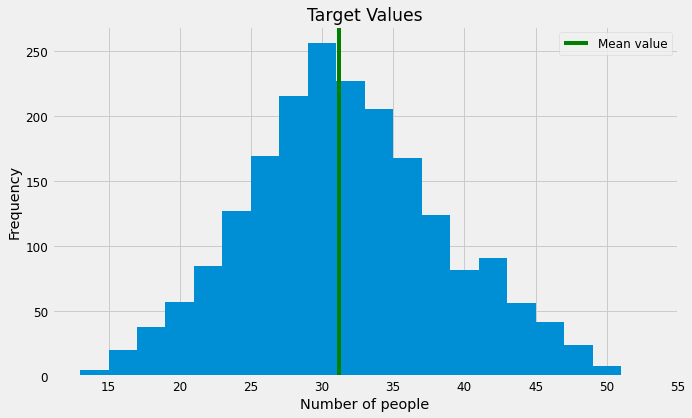

In [14]:
plt.hist(data['count'], bins=20)
plt.axvline(stats.loc['mean', 'count'], label='Mean value', color='green')
plt.legend()
plt.xlabel('Number of people')
plt.ylabel('Frequency')
plt.title('Target Values')
plt.show()

In [15]:
# Load the model.
detector = hub.load(MODEL_PATH)

The output dictionary of the model contains:
- num_detections: a tf.int tensor with only one value, the number of detections [N].
- detection_boxes: a tf.float32 tensor of shape [N, 4] containing bounding box coordinates in the following order: [ymin, xmin, ymax, xmax].
- detection_classes: a tf.int tensor of shape [N] containing detection class index from the label file.
- detection_scores: a tf.float32 tensor of shape [N] containing detection scores.
- raw_detection_boxes: a tf.float32 tensor of shape [1, M, 4] containing decoded detection boxes without Non-Max suppression. M is the number of raw detections.
- raw_detection_scores: a tf.float32 tensor of shape [1, M, 90] and contains class score logits for raw detection boxes. M is the number of raw detections.
- detection_anchor_indices: a tf.float32 tensor of shape [N] and contains the anchor indices of the detections after NMS.
- detection_multiclass_scores: a tf.float32 tensor of shape [1, N, 90] and contains class score distribution (including background) for detection boxes in the image including background class.

We will use "detection_classes" to count the number of persons detected in the image. Index 1 corresponds to "person".

 #### <a href='#Appendix'>Return to Appendix </a> 

_______________________


 # <a name='model'> Test Cases with EficentDet model </a>

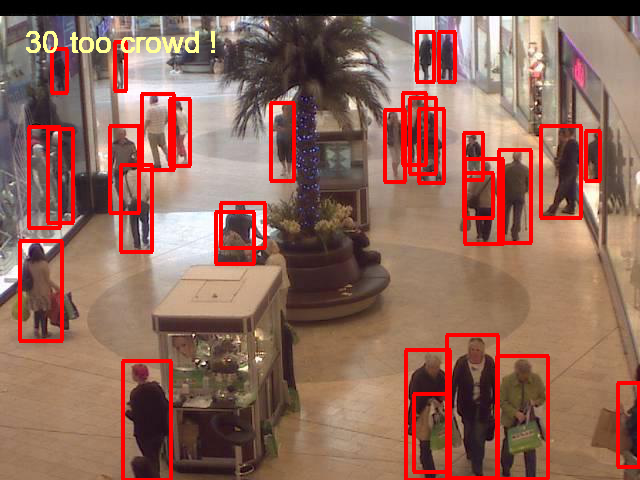

In [16]:
 #### <a href='#Appendix'>Return to Appendix </a> 

_______________________
# Object detection with no confidence threshold results in
# duplicate bounding boxes and false positives.
# Total number of people in an image is overestimated.
# Some mannequins are erroneously marked as people.
example_path = 'C:/Users/imora/Downloads/Crowd-Counting-TensorFlow-CNN-master/mall_dataset/frames/seq_000010.jpg'
results = detect_objects(example_path, detector)
draw_bb(example_path, results,threshold= 0.15)

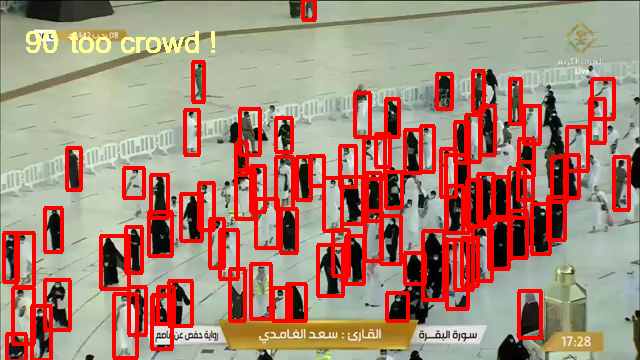

In [17]:
example_path = 'C:/Users/imora/Pictures/datasets/img_1.jpg'
results = detect_objects(example_path, detector)
draw_bb(example_path, results, threshold=0.10)

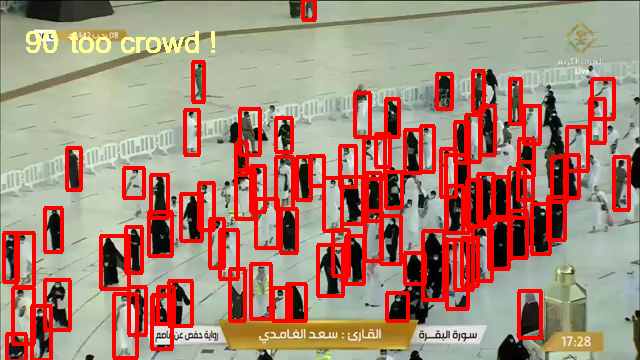

In [18]:
# With high threshold the model underestimates the number of people
# selecting only the most obvious objects at the foreground.
draw_bb(example_path, results,threshold=0.10)

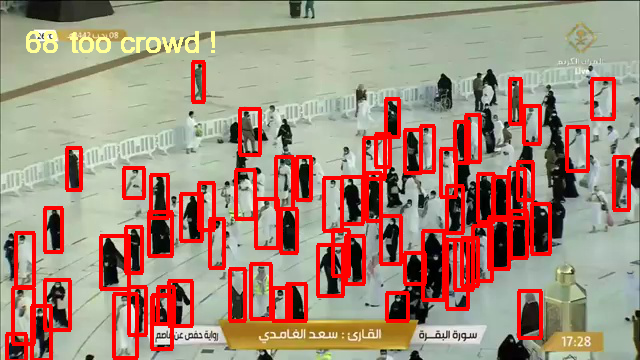

In [19]:
# With relatively low threshold the model is most accurate counting people
# that are located at the foreground and the middle of the picture.
# Objects at the background are mostly ignored.
draw_bb(example_path, results, threshold=0.15)

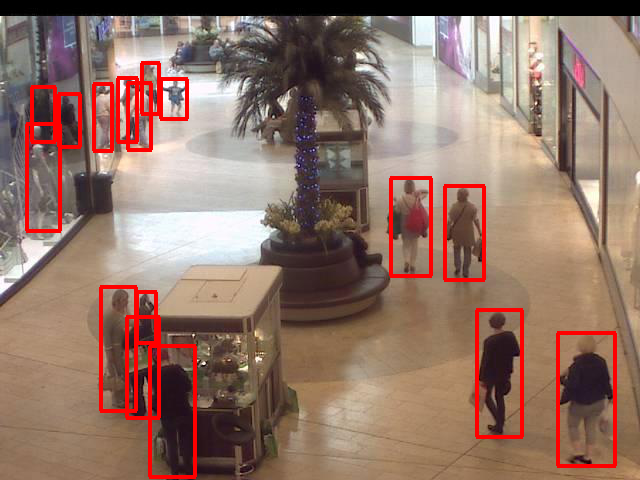

In [20]:
# Test the model on a very crowded image.
example_path = data.loc[data['count'] == data['count'].max(), 'path'].iloc[0]
results = detect_objects(example_path, detector)
draw_bboxes(example_path, results, threshold=0.25)

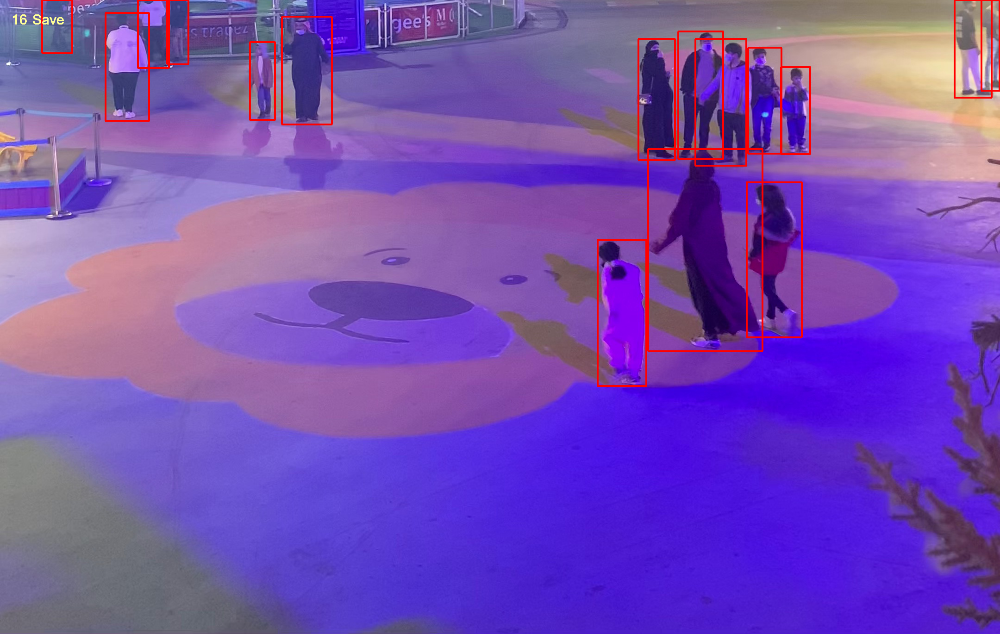

In [21]:
# Object detection with no confidence threshold results in
# duplicate bounding boxes and false positives.
# Total number of people in an image is overestimated.
# Some mannequins are erroneously marked as people.
example_path1 = 'C:/Users/imora/Videos/places/img_16.jpg'
results = detect_objects(example_path1, detector)
draw_bb(example_path1, results,threshold=0.10)

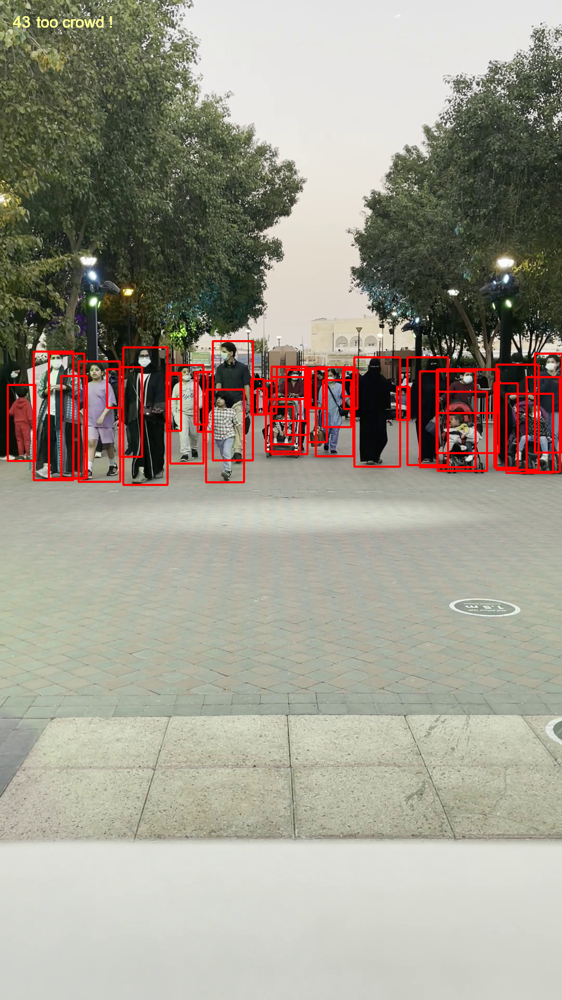

In [22]:
example_path1 = 'C:/Users/imora/Videos/rsd/img_9.jpg'
results = detect_objects(example_path1, detector)
draw_bb(example_path1, results,threshold=0.10)

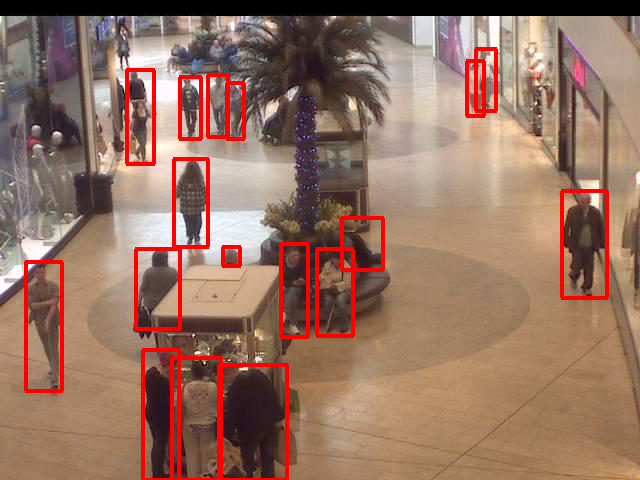

In [23]:
# Test the model on an image with small number of people.
example_path = data.loc[data['count'] == data['count'].min(), 'path'].iloc[0]
results = detect_objects(example_path, detector)
draw_bboxes(example_path, results, threshold=0.25)

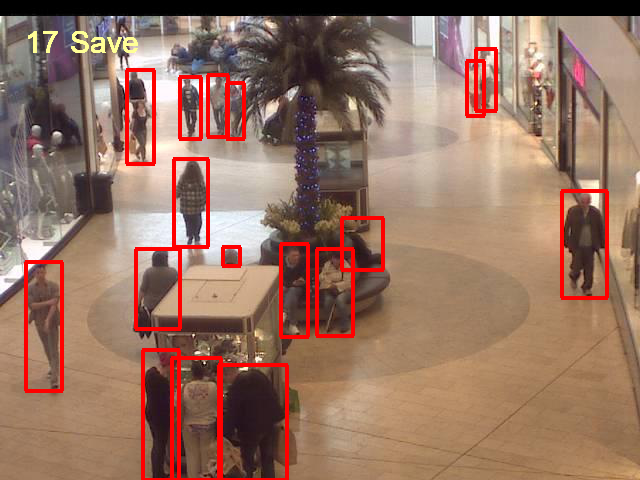

In [24]:
# Test the model on an image with small number of people.
example_path = data.loc[data['count'] == data['count'].min(), 'path'].iloc[0]
results = detect_objects(example_path, detector)
draw_bb(example_path, results, threshold=0.25)

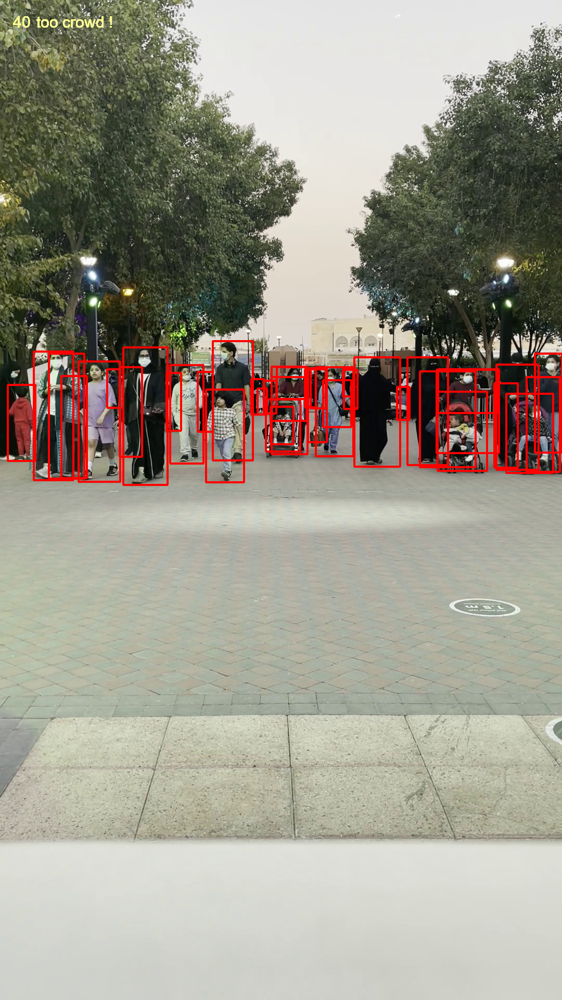

In [25]:
results = detect_objects(example_path1, detector)
draw_bb(example_path1, results, threshold=0.11)

We can see that the model is not perfect and occasionally drows duplicate bounding boxes or fails to detect a person at the background or in partially occluded areas of the image.

Let's check the model on a randomly selected subset of images using predicted class 1 ("person") with confidence scores above 0.25.

In [ ]:
# Performing object detection for 2,000 images takes a considerable time.
# The model processes images one at a time. Batch inference is not available.
# We can speed up the model by using multiprocessing, however it still takes a while.
# For testing purposes we will check the model performance on a randomly selected
# sample of 200 images (10% of the original data set).
sample = data.sample(frac=0.1)
start = time.perf_counter()
objects = []

with concurrent.futures.ThreadPoolExecutor() as executor:
    results = [executor.submit(count_persons, path, detector, threshold=0.25) for path in sample['path']]
    for f in tqdm(concurrent.futures.as_completed(results)):
        objects.append(f.result())

finish = time.perf_counter()
print(f'Finished in {round(finish - start, 2)} second(s).')

In [ ]:
# Compare predicted values with the ground truth.
sample['prediction'] = objects
sample.head(10)

In [ ]:
sample['mae'] = (sample['count'] - sample['prediction']).abs()
sample['mse'] = sample['mae'] ** 2

print(f'MAE = {sample["mae"].mean()}\nMSE = {sample["mse"].mean()}')
plt.hist(sample['mae'], bins=20)
plt.title('Absolute Errors')
plt.show()

In [ ]:
plt.scatter(sample['count'], sample['prediction'])
plt.xlabel('Actual person count')
plt.ylabel('Predicted person count')
plt.title('Predicted vs. Actual Count')
plt.show()

We can conclude that out-of-the-box solution cannot be used for this task. The model is good at detecting objects at the foreground and middle of the image and fails at "counting" numerous objects of the same class located all over the image. Despite the attempts to improve performance with confidence scores, the eror rate is high.

-----------------------------------

## Part 2: Transfer learning

We will load **InceptionResNetV2 model** from **Keras** applications and freeze the original weights. The model will be trained with a new regression head. The learning rate will be adjusted whenever validation loss is getting worse.

The original model was trained on images of size 299 x 299. We will resize the images accordingly using padding to avoid distorting the objects. To compensate for small number of training samples we will apply various image augmentation techniques randomly changing brightness, contract, saturation and hue and flipping the images left-to-right.

In [26]:
# TensorFlow settings and training parameters
AUTOTUNE = tf.data.experimental.AUTOTUNE
EPOCHS = 100
BATCH_SIZE = 16
PATIENCE = 10
LEARNING_RATE = 1e-3
IMAGE_SIZE = 299

In [28]:
set_seed()

In [29]:
# Create train and validation data sets.
data_train = data.head(1700)
data_valid = data.tail(300)

ds_train = tf.data.Dataset.from_tensor_slices((data_train['path'], data_train['count']))
ds_valid = tf.data.Dataset.from_tensor_slices((data_valid['path'], data_valid['count']))

ds_train = prepare_dataset(ds_train)
ds_valid = prepare_dataset(ds_valid, is_training=False)

In [31]:
# Load the model.
model = create_model()

early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=PATIENCE,
    restore_best_weights=True)

lr_reduction = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', patience=1, cooldown=1, verbose=1,
    factor=0.75, min_lr=1e-8)

history = model.fit(ds_train, validation_data=ds_valid,
                    epochs=EPOCHS, callbacks=[early_stop, lr_reduction],
                    use_multiprocessing=True, workers=os.cpu_count())

Epoch 1/100
107/107 [==============================] - 389s 4s/step - loss: 91.1390 - mean_absolute_error: 7.6302 - val_loss: 129.0268 - val_mean_absolute_error: 9.9423 - lr: 0.0010
Epoch 2/100
107/107 [==============================] - 353s 3s/step - loss: 80.2401 - mean_absolute_error: 7.3139 - val_loss: 88.6763 - val_mean_absolute_error: 8.0774 - lr: 0.0010
Epoch 3/100
107/107 [==============================] - 385s 4s/step - loss: 75.3717 - mean_absolute_error: 6.9831 - val_loss: 87.8963 - val_mean_absolute_error: 8.0305 - lr: 0.0010
Epoch 4/100
107/107 [==============================] - 413s 4s/step - loss: 73.4649 - mean_absolute_error: 6.8035 - val_loss: 85.6426 - val_mean_absolute_error: 7.9170 - lr: 0.0010
Epoch 5/100
107/107 [==============================] - 418s 4s/step - loss: 72.8160 - mean_absolute_error: 6.6678 - val_loss: 78.9042 - val_mean_absolute_error: 7.5850 - lr: 0.0010
Epoch 6/100
107/107 [==============================] - 416s 4s/step - loss: 70.7970 - mean_abs

Epoch 39/100
107/107 [==============================] - ETA: 0s - loss: 51.3630 - mean_absolute_error: 5.8000
Epoch 00039: ReduceLROnPlateau reducing learning rate to 7.508467933803331e-05.
107/107 [==============================] - 411s 4s/step - loss: 51.3630 - mean_absolute_error: 5.8000 - val_loss: 34.8708 - val_mean_absolute_error: 4.8835 - lr: 1.0011e-04
Epoch 40/100
107/107 [==============================] - ETA: 0s - loss: 50.7259 - mean_absolute_error: 5.7675
Epoch 00040: ReduceLROnPlateau reducing learning rate to 5.6313510867767036e-05.
107/107 [==============================] - 410s 4s/step - loss: 50.7259 - mean_absolute_error: 5.7675 - val_loss: 34.5681 - val_mean_absolute_error: 4.8518 - lr: 7.5085e-05
Epoch 41/100
107/107 [==============================] - ETA: 0s - loss: 50.2172 - mean_absolute_error: 5.7407
Epoch 00041: ReduceLROnPlateau reducing learning rate to 4.223513315082528e-05.
107/107 [==============================] - 409s 4s/step - loss: 50.2172 - mean_abso

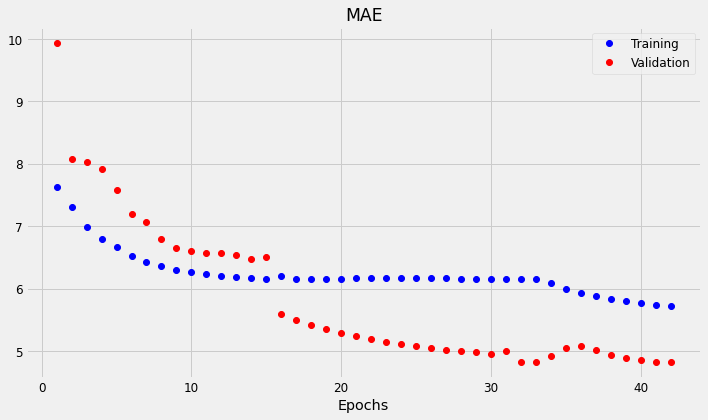

In [32]:
plot_history(history)

In [33]:
mse, mae = model.evaluate(ds_valid)
print(f'Validation MSE = {mse}\n'
      f'Validation MAE = {mae}')

19/19 [==============================] - 60s 3s/step - loss: 34.1827 - mean_absolute_error: 4.8230
Validation MSE = 34.18266296386719
Validation MAE = 4.822996616363525


In [37]:
loss_t, loss_v = model.losses(ds_valid)
print(f'Validation MSE = {loss_t}\n'
      f'Validation MAE = {mae}')

TypeError: __call__() missing 1 required positional argument: 'y_pred'

In [38]:
model.losses?

In [35]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_resnet_v2 (Functi  (None, 1536)             54336736  
 onal)                                                           
                                                                 
 dense (Dense)               (None, 512)               786944    
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 55,255,265
Trainable params: 918,529
Non-trainable params: 54,336,736
_________________________________________________________________


In [60]:
#model.save('model.h5')

-----------------------------------

## Resnet model

In [39]:
def create_modelr() -> tf.keras.Model:
    """Function initializes and compiles a regression model
    with pretrained feature extractor.
    :return: TF Model object
    """
    feature_model = tf.keras.applications.resnet50(
        include_top=False, pooling='avg')
    feature_model.trainable = False

    model = tf.keras.Sequential([
        tf.keras.Input((IMAGE_SIZE, IMAGE_SIZE, 3)),
        feature_model,
        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.Dense(1)
    ])

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
                  loss=tf.keras.losses.MeanSquaredError(),
                  metrics=[tf.keras.metrics.MeanAbsoluteError()])

    return model

In [40]:
# Setup some constants
size = 299
batch_size = 64

In [41]:
base_model = resnet50.ResNet50(
    weights='imagenet',  # Load the pretrained weights, trained on the ImageNet dataset.
    include_top=False,  # We don't include the fully-connected layer at the top of the network - we need to modify the top.
    input_shape=(size, size, 3),  # 224x224 was the original size ResNet was trained on, so I decided to use this.
    pooling='avg',  # A global average pooling layer will be added after the last convolutional block.
)

In [42]:
# Here we change the top (the last parts) of the network.
x = base_model.output  # Since we used pooling='avg', the output is of the pooling layer
x = Dense(1024, activation='relu')(x)  # We add a single fully-connected layer
predictions = Dense(1, activation='linear')(x)  # This is the new output layer - notice only 1 output, this will correspond to the number of people in the image

In [43]:
model2 = Model(inputs=base_model.input, outputs=predictions)

In [44]:
k = -7
for layer in model.layers[:k]:
    layer.trainable = False
print('Trainable:')
for layer in model.layers[k:]:
    print(layer.name)
    layer.trainable = True

Trainable:
inception_resnet_v2
dense
dense_1
dense_2


In [45]:
model2.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 305, 305, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 150, 150, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [46]:
# Define the optimizer - this function will iteratively improve parameters in order to minimise the loss. 
# The Adam optimization algorithm is an extension to stochastic gradient descent, which is usually more effective and fast.
optimizer = tf.keras.optimizers.Adam(
    # The most important parameter is the learning rate - controls the amount that the weights are updated during eache round of training.
    learning_rate=0.001,
    # Additional parameters to play with:
#     beta_1=0.9,
#     beta_2=0.999,
#     epsilon=1e-07,
)

In [47]:
# Compile the model
model2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
               loss=tf.keras.losses.MeanSquaredError(),
               metrics=[tf.keras.metrics.MeanAbsoluteError()]
#     optimizer=optimizer, 
#     loss="mean_squared_error",  # This is a classic regression score - the lower the better
#     metrics=['mean_absolute_error', 'mean_squared_error']
)

In [48]:
# Set a learning rate annealer - to have a decreasing learning rate during the training to reach efficiently the global minimum of the loss function. 
# The LR is decreased dynamically when the score is not improved. This keeps the advantage of the fast computation time with a high LR at the start.
learning_rate_reduction = ReduceLROnPlateau(
    monitor='val_mean_squared_error',  # Track the score on the validation set
    patience=3,  # Number of epochs in which no improvement is seen.
    verbose=1, 
    factor=0.2,  # Factor by which the LR is multiplied.
    min_lr=0.000001  # Don't go below this value for LR.
)

In [49]:
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=PATIENCE,
    restore_best_weights=True)

lr_reduction = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', patience=1, cooldown=1, verbose=1,
    factor=0.75, min_lr=1e-8)

history = model2.fit(ds_train, validation_data=ds_valid,
                    epochs=EPOCHS, callbacks=[early_stop, lr_reduction],
                    use_multiprocessing=True, workers=os.cpu_count())

Epoch 1/100
107/107 [==============================] - 987s 9s/step - loss: 108.6353 - mean_absolute_error: 7.8646 - val_loss: 214.7400 - val_mean_absolute_error: 13.5207 - lr: 0.0010
Epoch 2/100
107/107 [==============================] - ETA: 0s - loss: 77.1436 - mean_absolute_error: 7.1028
Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.0007500000356230885.
107/107 [==============================] - 922s 9s/step - loss: 77.1436 - mean_absolute_error: 7.1028 - val_loss: 410.1455 - val_mean_absolute_error: 19.4310 - lr: 0.0010
Epoch 3/100
107/107 [==============================] - ETA: 0s - loss: 70.5899 - mean_absolute_error: 6.4774
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0005625000048894435.
107/107 [==============================] - 967s 9s/step - loss: 70.5899 - mean_absolute_error: 6.4774 - val_loss: 291.2393 - val_mean_absolute_error: 16.0822 - lr: 7.5000e-04
Epoch 4/100
107/107 [==============================] - ETA: 0s - loss: 65.9132 - mean_absolu

 # <a name='Future'>Future Work </a> 

* We will connect our model with a complete automated live system that alerts security personnel or organizers to close the gates and organize crowds.

* We will transfer it qualitatively to the idea to make it customized for cars to regulate traffic, for example at traffic lights and highways.

* We will create another system dedicated to calculating the number of people who entered the event, for example, and making statistics at peak times, etc.

 #### <a href='#Appendix'>Return to Appendix </a> 

_______________________


 # <a name='Summary'>Summary </a> 

* We noticed that when we increase the epochs the model will be better 
* We found inceptionResNetV2 very useful with our model, and with adding layer it will be better.
* This model can used in any uses for object detection, and crowd management.

 #### <a href='#Appendix'>Return to Appendix </a> 

_______________________
